# Youtube Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
comments = pd.read_csv('GBcomments.csv', error_bad_lines=False)

b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


In [3]:
comments.head()

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0


In [4]:
!pip install textblob

## Checking for polarity of comments

In [5]:
from textblob import TextBlob

In [6]:
TextBlob('Its more accurate to call it the M+ (1000) be...	').sentiment.polarity

0.45000000000000007

In [7]:
comments.isnull().sum()

video_id         0
comment_text    28
likes            0
replies          0
dtype: int64

In [8]:
comments.dropna(inplace=True)

In [9]:
polarity=[]

for i in comments['comment_text']:
    polarity.append(TextBlob(i).sentiment.polarity)

In [10]:
comments['polarity']=polarity

In [11]:
comments.head(20)

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.450000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.000000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.000000
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.000000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.000000
5,jt2OHQh0HoQ,Keep calm and buy iphone 8 Keep calm and buy i...,0,0,0.300000
6,jt2OHQh0HoQ,i am a big fan of youtube and u !!!!!!!!!!!!!,0,0,0.000000
7,jt2OHQh0HoQ,You will never find Losers who line up and pay...,0,0,-0.100000
8,jt2OHQh0HoQ,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0,0,0.028571
9,jt2OHQh0HoQ,"I'm only here to see Emma, I love her so much!...",0,0,0.500000


## Positive Comments WordCloud

In [12]:
comments_positive = comments[comments['polarity']==1]

In [13]:
comments_positive.shape

(20400, 5)

In [14]:
comments_positive.head()

,video_id,comment_text,likes,replies,polarity
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.0
26,jt2OHQh0HoQ,The best thing to ever happen to iPhone,0,2,1.0
80,jt2OHQh0HoQ,Apple is always awesome \n\nhttps://youtu.be/r...,0,1,1.0
158,YPVcg45W0z4,das a lot of edditing you have done there ... ...,0,0,1.0
175,YPVcg45W0z4,Welcome to the Scandiworld!,0,0,1.0


In [15]:
!pip install wordcloud

In [16]:
from wordcloud import WordCloud,STOPWORDS

In [17]:
stopwords=set(STOPWORDS)

In [18]:
' '.join(comments_positive['comment_text'])

"Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life. The best thing to ever happen to iPhone Apple is always awesome \\n\\nhttps://youtu.be/rftzm6X1yP4 das a lot of edditing you have done there ... I like it :D Welcome to the Scandiworld! Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life. WHY DO I KEEP FREAKING LAUGHING EACH TIME I WATCH IT AGAIN ! even though I know how it will end. omg the best 😂 LIKE = MEET CELEBRITY \\nSUBSCRIBE = BECOME A BILLIONAIRE\\nSCROLL UP/DOWN = DEATH FOR YOU AND EVERYONE YOU LOVE!!!!!!!!!!!!!!!!!!!!!!!!!!!!! the sonic air timer was perfect no 16 on trending impressive My daughters name is lacey <3 I'm 17 and can proudly say Moon Dreamers was one of my favourite shows! if I could subscribe to Dude Perfect a million times I would You guys should make dude perfect sceets To be a dude perfect member it is so awesome .... 

In [19]:
total_comments=' '.join(comments_positive['comment_text'])

In [20]:
wordcloud=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments)

In [21]:
plt.figure(figsize=(15,5))

<Figure size 1080x360 with 0 Axes>

<Figure size 1080x360 with 0 Axes>

(-0.5, 999.5, 499.5, -0.5)

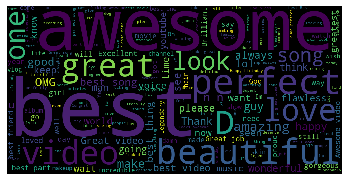

In [22]:
plt.imshow(wordcloud)
plt.axis('off')

## Negative Comments Wordcloud

In [23]:
comments_negative = comments[comments['polarity']==-1]

In [24]:
total_n_comments=' '.join(comments_negative['comment_text'])

In [25]:
comments_negative.shape

(3339, 5)

In [26]:
comments_negative.head()

,video_id,comment_text,likes,replies,polarity
1387,ql0Op1VcELw,boring,0,0,-1.0
1394,ql0Op1VcELw,0:22 **laughs at terrible pun**,1,1,-1.0
1530,-Ifnaxi2LQg,this is the worst thing i've heard. ever.,0,0,-1.0
1745,F2uJvwiSZAQ,People making jokes about 9/11 is truly disgus...,1,0,-1.0
1793,F2uJvwiSZAQ,Thats insane.,0,0,-1.0


In [27]:
wordcloud=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_n_comments)

(-0.5, 999.5, 499.5, -0.5)

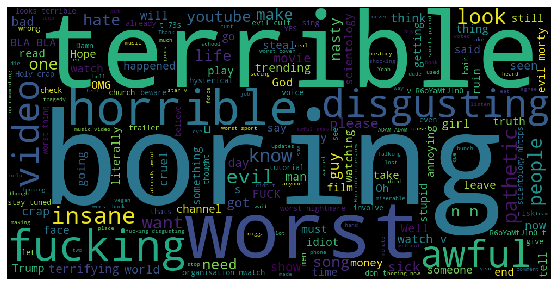

In [28]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

## Analysing Trending Tags on YouTube

In [29]:
videos=pd.read_csv('USvideos.csv',error_bad_lines=False)

b'Skipping line 2401: expected 11 fields, saw 21\nSkipping line 2800: expected 11 fields, saw 21\nSkipping line 5297: expected 11 fields, saw 12\nSkipping line 5299: expected 11 fields, saw 12\nSkipping line 5300: expected 11 fields, saw 12\nSkipping line 5301: expected 11 fields, saw 12\n'


In [30]:
videos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,https://i.ytimg.com/vi/XpVt6Z1Gjjo/default.jpg,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,https://i.ytimg.com/vi/K4wEI5zhHB0/default.jpg,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,https://i.ytimg.com/vi/cLdxuaxaQwc/default.jpg,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,https://i.ytimg.com/vi/WYYvHb03Eog/default.jpg,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,https://i.ytimg.com/vi/sjlHnJvXdQs/default.jpg,13.09


In [31]:
Tags_complete=' '.join(videos['tags'])

In [32]:
Tags_complete

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

#### Regular Expression Module

In [33]:
import re 

In [34]:
#Eliminating any words with a space except of a-z and A-Z 
TAGS=re.sub('[^a-zA-Z]',' ',Tags_complete)

In [35]:
TAGS

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button   M subscribers logan paul   year vlogging   year vlog dwarf mamba play button logan paul history youtube history   M   M plaque youtube button diamond button logang logang   life Apple iPhone    iPhone Ten iPhone Portrait Lighting A   Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone  none  apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event      apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone      apple iphone ios    the verge verge jacksfilms parody parodies iphone iphone x iphone   apple emoji a   a   films a   trailers independent films trailer HD official movie film a   movies oscar 

In [36]:
#Removing extra spacing
TAGS = re.sub(' +',' ',TAGS)

In [37]:
TAGS

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button M subscribers logan paul year vlogging year vlog dwarf mamba play button logan paul history youtube history M M plaque youtube button diamond button logang logang life Apple iPhone iPhone Ten iPhone Portrait Lighting A Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone none apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone apple iphone ios the verge verge jacksfilms parody parodies iphone iphone x iphone apple emoji a a films a trailers independent films trailer HD official movie film a movies oscar winner academy award winner The Disaster A

In [38]:
wc=WordCloud(width=1000,height=500,stopwords=set(STOPWORDS)).generate(TAGS)

(-0.5, 999.5, 499.5, -0.5)

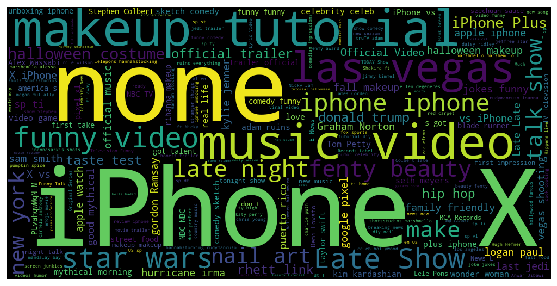

In [39]:
plt.figure(figsize=(15,5))
plt.imshow(wc)
plt.axis('off')

## Analysis of Like, Dislikes and Views. How they are co-related 

Text(0.5, 1.0, 'Regression plot for views and likes')

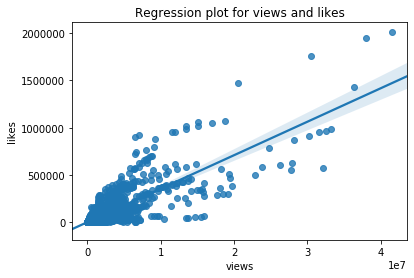

In [40]:
sns.regplot(data=videos, x='views',y='likes')
plt.title('Regression plot for views and likes')
#As the likes increases views increases as well

Text(0.5, 1.0, 'Regression plot for views and Dislikes')

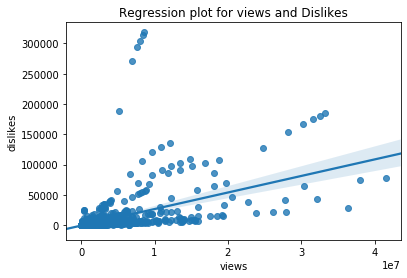

In [41]:
sns.regplot(data=videos, x='views',y='dislikes')
plt.title('Regression plot for views and Dislikes')
# As the Dislikes increases, Views does not increases 

In [42]:
df_corr= videos[['views','likes','dislikes']]

In [43]:
df_corr.corr()

,views,likes,dislikes
views,1.000000,0.832844,0.541955
likes,0.832844,1.000000,0.497439
dislikes,0.541955,0.497439,1.000000


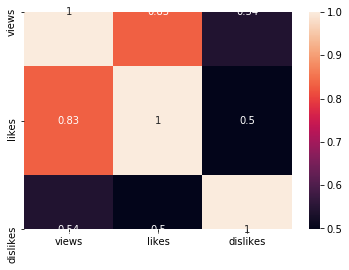

In [44]:
sns.heatmap(df_corr.corr(),annot=True)

## Analysis of Emojis on comments

In [45]:
comments.head(100)

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.45000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.00000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.00000
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.00000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.00000
...,...,...,...,...,...
95,jt2OHQh0HoQ,Do all to Save the people muslims of burma,0,1,0.00000
96,jt2OHQh0HoQ,where is iPhone 9?,0,1,0.00000
97,jt2OHQh0HoQ,Wow apples starting ideas from the galaxy now 🤔🤔,0,1,0.05000
98,jt2OHQh0HoQ,birby,0,1,0.00000


In [47]:
comments['comment_text'][1]

'To be there with a samsung phone\\n😂😂😂'

In [48]:
print('\U0001F600')

😀


In [62]:
#!pip install emoji

In [53]:
import emoji

In [54]:
emoji.__version__

'0.6.0'

In [55]:
#!pip uninstall emoji

In [49]:
!pip install emoji==0.6.0

  Created wheel for emoji: filename=emoji-0.6.0-cp37-none-any.whl size=49720 sha256=062896732ef4262f3b22aa264f1650876e44e03eb16673f8e9973b8756a6ede7
  Stored in directory: C:\Users\sraja\AppData\Local\pip\Cache\wheels\46\2c\8b\9dcf5216ca68e14e0320e283692dce8ae321cdc01e73e17796
Successfully built emoji
  Found existing installation: emoji 1.2.0
    Uninstalling emoji-1.2.0:
      Successfully uninstalled emoji-1.2.0


In [50]:
len(comments)

718424

In [57]:
comment = comments['comment_text'][1]

In [58]:
[c for c in comment if c in emoji.UNICODE_EMOJI]

['😂', '😂', '😂']

In [59]:
str=''
for i in comments['comment_text']:
    list=[c for c in i if c in emoji.UNICODE_EMOJI]
    for ele in list:
        str=str+ele

In [60]:
len(str)

341868

In [63]:
str

'😂😂😂😭😭😭😢😢😢❤❤😂👏👇👇👇👇👇👇👇👇👇👇🌞😎😣😥😫😭✌😂👎🏻👎🏻👎🏻👎🏻😂🖕😘😘▶⏭⏮◀🔥🔥😊😊🤔🤔😂😂😂😂👏🏻👏🏻❤❤😜😍😍😅❤😍😍✌😂😂😂😊😂😂😂😂😏😏🇪🇸😭💔😊❤❤❤❤❤😂😂😊❤😂🤣✨🌈😘😂😂❤😊😂😊😂💗😂😊😊😊💖🐢😉😍😂😂💗💗😻😻❤😂😂❤❤🤗👌🏼👌🏼😂😂😂😂💖😩🙊♥♥♥😂😂😂💙💙💙💙💙💙😂😂😂❤❤❤😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😱😊😛🌳🌽🎃🚣🚂😂😂😊😕😋🤣😅😢💔😂😊🤡🙏🙏🙏👊🏿🙇🏽👋😅😅😅😅😂😂🤔😎😎😎😎😎😎😎😍😍😍😍😍😍😘😘😘😘😘😘😘😲🖕💪🤘💓☺☺😂😂😂💕😄😄😍💕😉😩❤❤💕❤😂💕😍💗👫💖😆💕💖💕😍😍😊😄😍😀💗🦄😍😊😂😊👍😍♥❤😂👶🏻🤗☺😘💙💙💙😍😍😊😎🤘🖤👌👌😍😂👌🍍😎😎😄😄😄😄😂😂😂😬💜💜💜😭😂😍😍💖😂😂😂😂😂😂😂😭😂😭😂😭😂😂😂😍😍😍😭😍😍😂👀👀🤔😂😂😂😂😂😂😂😂😂😂🍸🍸🍸🍸🍸😂😂😂🤣🤣🤣😂😂😂😂😍💜💜💜💜😂😂😂😅😂😍💖😂😻😉🔥❤😻❤😭😭😭😭😭😭😭👍🏻😍💚💙❤❤😫❤❤❤❤❤♥😍❤😊😍😎💄🐐😅😂😂😊😊👀👌🏽❤❤❤😂💖🎉💪💪🏽😎🙌🙌😜❤❤💛💛😎🙏💚🎉🎉❤🎉🎉🎉🎉🎊🎉🎊🎉😭💗😍😍😍😍😍😍😍👏✌😁❤❤😂💋💋👫💘😻💋💋😂👑🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥😂😐😑😩👌🏻🔥💖👏🏻👀✨👅💦💕❤😍🔥🔥🔥❤❤❤❤❤❤❤👌😍😍😍😞🌴💜💜💜💜😍😍😍😍😍❤❤❤❤❤😊❤❤❤❤🍔🍟🇺🇸😒🌿😄😄😄😉🍲🍱🎏❤💪👊🏽😘😂😂😂❤🙋☺😍😍😚💕😉😂❤❤😊☺💓🌸🙄🙄🙄🙁😞😊🙄😍😨😍😍😍😍😎😃😂😍😏😌😂😎🤑😂😉👍🏻🔥💯🚨😊☺😂😂😂🤣🙂❤❤😀😀😀♥♥😂❤😂😓😭😂❤❤😖😖😂😂😂💗💝😘💐💐💐😂😍☺😂❤😭💕🙌🏽🙌🏽🙌🏽😘😘❤❤💖😫😖📱😂😏🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😁🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😎😂😂👍🏼💯💕♥♥♥😱😱😱❤❤❤😍😍😩😩😩😩😩😩😩😍😻😻😻😻😻😳🥀♥♥♥♥♥♥😍😍😍🙃😂💕💕💕😍💕💕❤❤💕😍🍫🌹💖🇸🇸🇸🇸❤😍👸🏿👸🏿👸🏿👸🏿👸🏿💗😊😊😩❤👌🏼😻😊😍❤😂😂👏🏼❤❤❤❤❤😍😍😍💚💚💚💚💚😍😭🌹😍❤😍😍😍💚💚💚💚💚😍💚💚💚☺💙😀😍💚😕😍👌😂😂😂😍👌🏻💗❤💚💚💚😸😙😙😘💚💚💚💚😍😭😭💖💓💓💓😍❤😘😘🤗🤗🤗❤😀😀💓💓💓❤😂❤😍❤❤♥♥♥❤🙌❤😂❤❤😍❤💜😍😭😍😍😍😊💗💕😍❤💗💗💛💛💛💖💖😍😐😍😍😍😍🗿😂🤗😩😩😩💖💖💖❤❤❤❤❤😍😍✨😍👍🏻😁😂😍💅❤😘❤❤😈👀😄😈👍☝👆✊👌✌👊✋👋👏👐👉👈💔😂😂😬😭😥☺😂😂😂😂😍😍😍😜😂😂😂😂😂😒👎🏽😱😱😱😱😂😎😛🙊✊✌😑😑😑👌😊

In [64]:
result={}
for i in set(str):
    result[i]=str.count(i)
    

In [65]:
result

{'🐈': 62,
 '🤷': 329,
 '🎯': 37,
 '❕': 18,
 '⤴': 6,
 '👵': 26,
 '💚': 2138,
 '⏯': 4,
 '🏚': 6,
 '👱': 57,
 '🐛': 30,
 '🏩': 6,
 '🐢': 24,
 '🏑': 12,
 '🎓': 18,
 '⏱': 6,
 '🎬': 35,
 '❤': 36780,
 '🎻': 30,
 '🐁': 31,
 '😪': 299,
 '🏸': 6,
 '🖌': 6,
 '😟': 147,
 '🐀': 45,
 '🍇': 24,
 '🇳': 163,
 '🧡': 2,
 '🤓': 187,
 '🎛': 7,
 '🗑': 15,
 '🥞': 4,
 '🤴': 10,
 '🦔': 2,
 '🏵': 28,
 '⏪': 14,
 '🏟': 12,
 '⛲': 11,
 '💁': 241,
 '🐣': 98,
 '😁': 2504,
 '📑': 8,
 '🐗': 16,
 '🇹': 321,
 '🤚': 23,
 '🚄': 6,
 '☄': 23,
 '🍝': 22,
 '🈴': 5,
 '⏲': 4,
 '🥜': 1,
 '👫': 58,
 '🎧': 183,
 '🐊': 61,
 '🎇': 149,
 '♊': 9,
 '🏌': 4,
 '🇯': 52,
 '😳': 545,
 '♌': 16,
 '🐪': 13,
 '👼': 76,
 '🏉': 16,
 '😨': 390,
 '😘': 6334,
 '🈂': 5,
 '🐹': 22,
 '🔒': 18,
 '📩': 9,
 '🌙': 80,
 '🍐': 12,
 '🐺': 125,
 '🇼': 26,
 '👬': 47,
 '🔕': 28,
 '✏': 21,
 '😮': 596,
 '🕞': 7,
 '🛤': 5,
 '🕊': 35,
 '📢': 27,
 '🏨': 9,
 '🍶': 17,
 '♋': 15,
 '🚑': 10,
 '📆': 8,
 '🎷': 48,
 '🐉': 23,
 '🔚': 5,
 '👭': 75,
 '🆔': 5,
 '🎎': 8,
 '💅': 166,
 '🍻': 46,
 '🇬': 199,
 '🤙': 171,
 '🌽': 46,
 '💼': 22,
 '🎮': 16,
 '🤳': 239,
 

In [66]:
result.items()

dict_items([('🐈', 62), ('🤷', 329), ('🎯', 37), ('❕', 18), ('⤴', 6), ('👵', 26), ('💚', 2138), ('⏯', 4), ('🏚', 6), ('👱', 57), ('🐛', 30), ('🏩', 6), ('🐢', 24), ('🏑', 12), ('🎓', 18), ('⏱', 6), ('🎬', 35), ('❤', 36780), ('🎻', 30), ('🐁', 31), ('😪', 299), ('🏸', 6), ('🖌', 6), ('😟', 147), ('🐀', 45), ('🍇', 24), ('🇳', 163), ('🧡', 2), ('🤓', 187), ('🎛', 7), ('🗑', 15), ('🥞', 4), ('🤴', 10), ('🦔', 2), ('🏵', 28), ('⏪', 14), ('🏟', 12), ('⛲', 11), ('💁', 241), ('🐣', 98), ('😁', 2504), ('📑', 8), ('🐗', 16), ('🇹', 321), ('🤚', 23), ('🚄', 6), ('☄', 23), ('🍝', 22), ('🈴', 5), ('⏲', 4), ('🥜', 1), ('👫', 58), ('🎧', 183), ('🐊', 61), ('🎇', 149), ('♊', 9), ('🏌', 4), ('🇯', 52), ('😳', 545), ('♌', 16), ('🐪', 13), ('👼', 76), ('🏉', 16), ('😨', 390), ('😘', 6334), ('🈂', 5), ('🐹', 22), ('🔒', 18), ('📩', 9), ('🌙', 80), ('🍐', 12), ('🐺', 125), ('🇼', 26), ('👬', 47), ('🔕', 28), ('✏', 21), ('😮', 596), ('🕞', 7), ('🛤', 5), ('🕊', 35), ('📢', 27), ('🏨', 9), ('🍶', 17), ('♋', 15), ('🚑', 10), ('📆', 8), ('🎷', 48), ('🐉', 23), ('🔚', 5), ('👭', 75), (

In [71]:
final={}
for key,value in sorted(result.items(),key = lambda item:item[1]):
    final[key]=value

In [72]:
final

{'🥜': 1,
 '🥟': 1,
 '🦏': 1,
 '🧤': 1,
 '🤺': 1,
 '🥡': 1,
 '🤹': 1,
 '🥚': 1,
 '🧣': 1,
 '🥌': 1,
 '🤽': 1,
 '🤾': 1,
 '🛷': 1,
 '🧠': 1,
 '🦓': 1,
 '🛒': 1,
 '🥨': 1,
 '🤟': 1,
 '🧡': 2,
 '🦔': 2,
 '🧘': 2,
 '🧢': 2,
 '🧒': 2,
 '🤱': 2,
 '🎌': 2,
 '🧝': 2,
 '🧛': 2,
 '🥅': 2,
 '🦕': 2,
 '🦖': 2,
 '🤨': 3,
 '🤫': 3,
 '🥖': 3,
 '🧐': 3,
 '🥄': 3,
 '🤯': 3,
 '⏯': 4,
 '🥞': 4,
 '⏲': 4,
 '🏌': 4,
 '☸': 4,
 '☦': 4,
 '🦐': 4,
 '♾': 4,
 '🗄': 4,
 '⚗': 4,
 '🦍': 4,
 '⏸': 4,
 '⏏': 4,
 '🦆': 4,
 '⚙': 4,
 '🥈': 4,
 '💹': 4,
 '🤵': 4,
 '🗓': 4,
 '🥝': 4,
 '🛢': 4,
 '🏷': 4,
 '🖇': 4,
 '🛬': 4,
 '🤬': 4,
 '🖍': 4,
 '♟': 4,
 '🛣': 4,
 '⏹': 4,
 '🗂': 4,
 '🧟': 4,
 '🈴': 5,
 '🈂': 5,
 '🛤': 5,
 '🔚': 5,
 '🆔': 5,
 '🖊': 5,
 'ℹ': 5,
 '🕎': 5,
 '🈯': 5,
 '🈵': 5,
 '🚠': 5,
 '⌨': 5,
 '🔣': 5,
 'Ⓜ': 5,
 '🔂': 5,
 '↖': 5,
 '⏺': 5,
 '🕹': 5,
 '🔃': 5,
 '🥛': 5,
 '🗒': 5,
 '🗃': 5,
 '🛋': 5,
 '➿': 5,
 '🔼': 5,
 '🚁': 5,
 '🈁': 5,
 '🆖': 5,
 '❎': 5,
 '🤮': 5,
 '🚟': 5,
 '◽': 5,
 '♠': 5,
 '♦': 5,
 '🧜': 5,
 '🔡': 5,
 '🈲': 5,
 '🔄': 5,
 '⛴': 5,
 '🖨': 5,
 '☂': 5,
 '🔠': 5,
 '🆎': 5,
 '🎐': 5,
 

In [73]:
keys=[*final.keys()]

In [74]:
keys

['🥜',
 '🥟',
 '🦏',
 '🧤',
 '🤺',
 '🥡',
 '🤹',
 '🥚',
 '🧣',
 '🥌',
 '🤽',
 '🤾',
 '🛷',
 '🧠',
 '🦓',
 '🛒',
 '🥨',
 '🤟',
 '🧡',
 '🦔',
 '🧘',
 '🧢',
 '🧒',
 '🤱',
 '🎌',
 '🧝',
 '🧛',
 '🥅',
 '🦕',
 '🦖',
 '🤨',
 '🤫',
 '🥖',
 '🧐',
 '🥄',
 '🤯',
 '⏯',
 '🥞',
 '⏲',
 '🏌',
 '☸',
 '☦',
 '🦐',
 '♾',
 '🗄',
 '⚗',
 '🦍',
 '⏸',
 '⏏',
 '🦆',
 '⚙',
 '🥈',
 '💹',
 '🤵',
 '🗓',
 '🥝',
 '🛢',
 '🏷',
 '🖇',
 '🛬',
 '🤬',
 '🖍',
 '♟',
 '🛣',
 '⏹',
 '🗂',
 '🧟',
 '🈴',
 '🈂',
 '🛤',
 '🔚',
 '🆔',
 '🖊',
 'ℹ',
 '🕎',
 '🈯',
 '🈵',
 '🚠',
 '⌨',
 '🔣',
 'Ⓜ',
 '🔂',
 '↖',
 '⏺',
 '🕹',
 '🔃',
 '🥛',
 '🗒',
 '🗃',
 '🛋',
 '➿',
 '🔼',
 '🚁',
 '🈁',
 '🆖',
 '❎',
 '🤮',
 '🚟',
 '◽',
 '♠',
 '♦',
 '🧜',
 '🔡',
 '🈲',
 '🔄',
 '⛴',
 '🖨',
 '☂',
 '🔠',
 '🆎',
 '🎐',
 '🖼',
 '⛱',
 '⛏',
 '🧖',
 '↔',
 '🔳',
 '◻',
 '🔢',
 '✡',
 '🚎',
 '⚒',
 '🚉',
 '🗳',
 '㊙',
 '🛂',
 '🔖',
 '↪',
 '↩',
 '🔲',
 '🛥',
 '⛸',
 '🈹',
 '🗞',
 '🔁',
 '🚛',
 '🏮',
 '🗜',
 '🥉',
 '🌫',
 '⚾',
 '🖲',
 '🔤',
 '🦒',
 '↕',
 '🚻',
 '🈳',
 '⤴',
 '🏚',
 '🏩',
 '⏱',
 '🏸',
 '🖌',
 '🚄',
 '🌥',
 '⛹',
 '🦌',
 '🌉',
 '🛁',
 '⏫',
 '♻',
 '🛑',
 '🔀',
 '🕴',
 '🧙',
 '🛠',
 '🎟'

In [76]:
values=[*final.values()]

In [77]:
values

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,


In [78]:
df=pd.DataFrame({'chars':keys[-20:],'num':values[-20:]})

In [79]:
df

,chars,num
0,🙌,2734
1,🏼,2961
2,💙,2968
3,💗,3071
4,👌,3534
5,💜,3616
6,🏻,4412
7,💖,4809
8,😊,4946
9,👏,5357


In [80]:
import plotly.graph_objs as go
from plotly.offline import iplot

In [82]:
trace=go.Bar(
x=df['chars'],
y=df['num']
)

iplot([trace])